In [1]:
import numpy as np
import pandas as pd
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import time
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import shutil
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
import tensorflow as tf
print(tf. __version__)

2.12.0


In [3]:
data_directory = r'/kaggle/input/agronify-dataset/Cassava Leaf Disease Image Dataset/Cassava_paper_dataset'

min_samples = 300

filepaths = []
labels = []
class_list = os.listdir(data_directory)

for class_name in class_list:
    class_path = os.path.join(data_directory, class_name)
    file_list = os.listdir(class_path)

    if len(file_list) >= min_samples:
        for file_name in file_list:
            file_path = os.path.join(class_path, file_name)
            filepaths.append(file_path)
            labels.append(class_name)
    else:
        print('Class', class_name,
              'has only', len(file_list),
              'samples and will not be included in the dataframe')

filepaths_series = pd.Series(filepaths, name='filepaths')
labels_series = pd.Series(labels, name='labels')
df = pd.concat([filepaths_series, labels_series], axis=1)

train_df, dummy_df = train_test_split(df,
                                      train_size=0.8,
                                      shuffle=True,
                                      random_state=42,
                                      stratify=df['labels'])
valid_df, test_df = train_test_split(dummy_df,
                                     train_size=0.5,
                                     shuffle=True,
                                     random_state=42,
                                     stratify=dummy_df['labels'])

print('train_df length:', len(train_df),
      'test_df length:', len(test_df),
      'valid_df length:', len(valid_df))

classes = sorted(list(train_df['labels'].unique()))
class_count = len(classes)
print('The number of classes in the dataset is:', class_count)

groups = train_df.groupby('labels')
print('{0:^30s} {1:^13s}'.format('CLASS', 'IMAGE COUNT'))

count_list = []
class_list = []

for label in sorted(list(train_df['labels'].unique())):
    group = groups.get_group(label)
    count_list.append(len(group))
    class_list.append(label)
    print('{0:^30s} {1:^13s}'.format(label, str(len(group))))

max_value = np.max(count_list)
max_index = count_list.index(max_value)
max_class = class_list[max_index]

min_value = np.min(count_list)
min_index = count_list.index(min_value)
min_class = class_list[min_index]

print(max_class, 'has the most images:', max_value, ',',
      min_class, 'has the least images:', min_value)

height_total = 0
width_total = 0
train_df_sample = train_df.sample(n=100, random_state=123, axis=0)

for i in range(len(train_df_sample)):
    file_path = train_df_sample['filepaths'].iloc[i]
    img = plt.imread(file_path)
    shape = img.shape
    height_total += shape[0]
    width_total += shape[1]

print('Average height:', height_total // 100,
      'Average width:', width_total // 100,
      'Aspect ratio:', height_total / width_total)

train_df length: 1799 test_df length: 225 valid_df length: 225
The number of classes in the dataset is: 6
            CLASS               IMAGE COUNT 
          CassavaBLS                309     
          CassavaBSD                318     
          CassavaGM                 247     
          CassavaHL                 283     
          CassavaMD                 310     
          CassavaRM                 332     
CassavaRM has the most images: 332 , CassavaGM has the least images: 247
Average height: 3273 Average width: 4184 Aspect ratio: 0.7822682205850373


In [4]:
def balance_dataframe(dataframe, target_samples, working_directory, image_size):
    dataframe = dataframe.copy()
    print('Initial length of the dataframe is', len(dataframe))
    augmented_directory = os.path.join(working_directory, 'aug')

    if os.path.isdir(augmented_directory):
        shutil.rmtree(augmented_directory)
    os.mkdir(augmented_directory)

    for label in dataframe['labels'].unique():
        class_directory = os.path.join(augmented_directory, label)
        os.mkdir(class_directory)

    total_augmented = 0
    image_generator = ImageDataGenerator(horizontal_flip=True,
                                         rotation_range=20,
                                         width_shift_range=.2,
                                         height_shift_range=.2,
                                         zoom_range=.2, 
                                         brightness_range=[0.15, 2.0],
                                         shear_range=0.15,
                                         vertical_flip=True,
                                         fill_mode="reflect")
    groups = dataframe.groupby('labels')

    for label in dataframe['labels'].unique():
        group = groups.get_group(label)
        sample_count = len(group)

        if sample_count < target_samples:
            delta = target_samples - sample_count
            target_directory = os.path.join(augmented_directory, label)
            msg='{0:40s} for class {1:^30s} creating {2:^5s} augmented images'.format(' ', label, str(delta))
            #msg = 'Creating {0} augmented images for class {1}'.format(delta, label)
            print(msg, '\r', end='')

            augmentation_generator = image_generator.flow_from_dataframe(group,
                                                                         x_col='filepaths',
                                                                         y_col=None,
                                                                         target_size=image_size,
                                                                         class_mode=None,
                                                                         batch_size=1,
                                                                         shuffle=False,
                                                                         save_to_dir=target_directory,
                                                                         save_prefix='aug-',
                                                                         color_mode='rgb',
                                                                         save_format='jpg')

            augmented_image_count = 0
            
            while augmented_image_count < delta:
                images = next(augmentation_generator)
                augmented_image_count += len(images)

            total_augmented += augmented_image_count

    print('Total augmented images created:', total_augmented)

    augmented_filepaths = []
    augmented_labels = []
    class_list = os.listdir(augmented_directory)

    for class_name in class_list:
        class_path = os.path.join(augmented_directory, class_name)
        file_list = os.listdir(class_path)

        for file_name in file_list:
            file_path = os.path.join(class_path, file_name)
            augmented_filepaths.append(file_path)
            augmented_labels.append(class_name)

    augmented_filepaths_series = pd.Series(augmented_filepaths, name='filepaths')
    augmented_labels_series = pd.Series(augmented_labels, name='labels')

    augmented_df = pd.concat([augmented_filepaths_series, augmented_labels_series], axis=1)

    dataframe = pd.concat([dataframe, augmented_df], axis=0).reset_index(drop=True)
    print('Length of augmented dataframe is now', len(dataframe))

    return dataframe


target_samples = max_value +200
working_directory = r'./'
image_size = (224, 224)
train_df = balance_dataframe(train_df, target_samples, working_directory, image_size)

Initial length of the dataframe is 1799
Found 310 validated image filenames.     for class           CassavaMD            creating  222  augmented images 
Found 332 validated image filenames.     for class           CassavaRM            creating  200  augmented images 
Found 247 validated image filenames.     for class           CassavaGM            creating  285  augmented images 
Found 318 validated image filenames.     for class           CassavaBSD           creating  214  augmented images 
Found 309 validated image filenames.     for class           CassavaBLS           creating  223  augmented images 
Found 283 validated image filenames.     for class           CassavaHL            creating  249  augmented images 
Total augmented images created: 1393
Length of augmented dataframe is now 3192


In [5]:
train_batch_size = 20
train_data_generator = ImageDataGenerator(horizontal_flip=True,
                                          rotation_range=20,
                                          width_shift_range=.2,
                                          height_shift_range=.2,
                                          zoom_range=.2)
t_and_v_data_generator = ImageDataGenerator()

train_message = '{0:70s} for train generator'.format(' ')
print(train_message, '\r', end='')

train_generator = train_data_generator.flow_from_dataframe(train_df,
                                                           x_col='filepaths',
                                                           y_col='labels',
                                                           target_size=image_size,
                                                           class_mode='categorical',
                                                           color_mode='rgb',
                                                           shuffle=True,
                                                           batch_size=train_batch_size)

valid_message = '{0:70s} for valid generator'.format(' ')
print(valid_message, '\r', end='')

valid_generator = t_and_v_data_generator.flow_from_dataframe(valid_df,
                                                             x_col='filepaths',
                                                             y_col='labels',
                                                             target_size=image_size,
                                                             class_mode='categorical',
                                                             color_mode='rgb',
                                                             shuffle=False,
                                                             batch_size=train_batch_size)

test_length = len(test_df)
test_batch_size = sorted([int(test_length/n) for n in range(1, test_length+1) if test_length % n == 0 and test_length/n <= 80], reverse=True)[0]
test_steps = int(test_length / test_batch_size)

test_message = '{0:70s} for test generator'.format(' ')
print(test_message, '\r', end='')

test_generator = t_and_v_data_generator.flow_from_dataframe(test_df,
                                                            x_col='filepaths',
                                                            y_col='labels',
                                                            target_size=image_size,
                                                            class_mode='categorical',
                                                            color_mode='rgb',
                                                            shuffle=False,
                                                            batch_size=test_batch_size)

classes = list(train_generator.class_indices.keys())
class_indices = list(train_generator.class_indices.values())
class_count = len(classes)
labels = test_generator.labels

print('test batch size:', test_batch_size, '  test steps:', test_steps, 'number of classes:', class_count)

Found 3192 validated image filenames belonging to 6 classes.           for train generator 
Found 225 validated image filenames belonging to 6 classes.            for valid generator 
Found 225 validated image filenames belonging to 6 classes.            for test generator 
test batch size: 75   test steps: 3 number of classes: 6


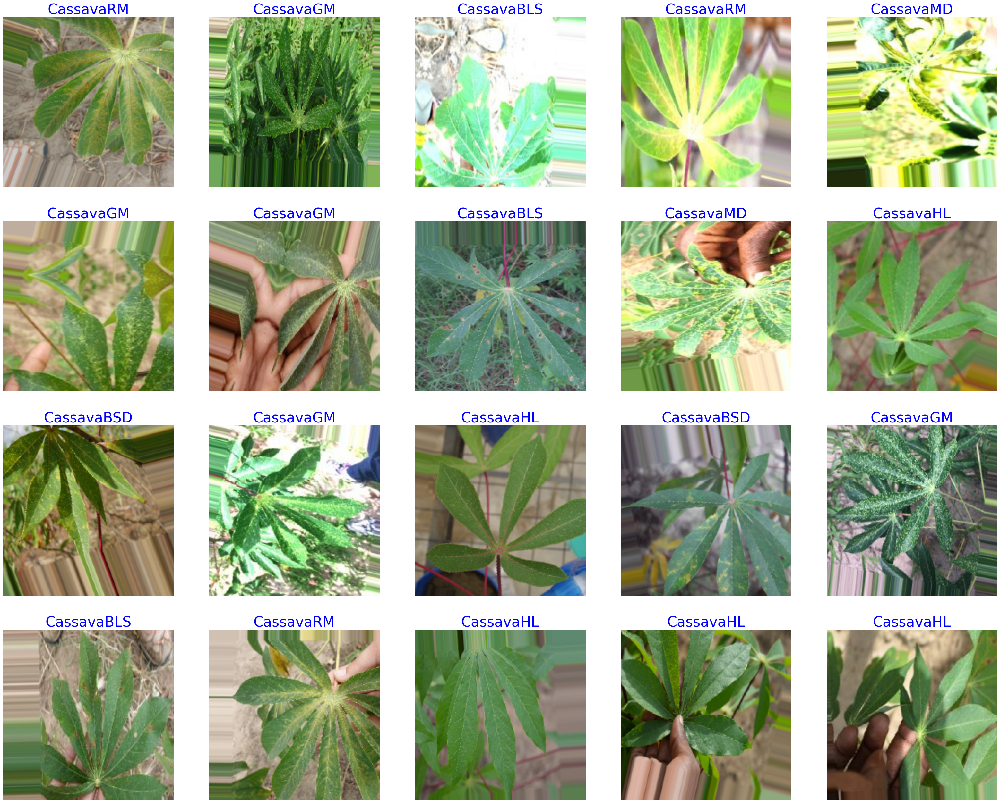

In [6]:
def show_image_samples(data_generator):
    class_dict = data_generator.class_indices
    classes = list(class_dict.keys())
    images, labels = next(data_generator)
    plt.figure(figsize=(40, 40))
    length = len(labels)
    if length < 25:
        r = length
    else:
        r = 25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color='blue', fontsize=32)
        plt.axis('off')
    plt.show()

show_image_samples(train_generator)

In [7]:
class LR_ASK(keras.callbacks.Callback):
    def __init__(self, model, total_epochs, ask_epoch):
        super(LR_ASK, self).__init__()
        self.model = model
        self.ask_epoch = ask_epoch
        self.total_epochs = total_epochs
        self.ask = True
        self.lowest_val_loss = np.inf
        self.best_weights = self.model.get_weights()
        self.best_epoch = 1

    def on_train_begin(self, logs=None):
        if self.ask_epoch == 0:
            print('You set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch = 1
        if self.ask_epoch >= self.total_epochs:
            print('ask_epoch >= total_epochs, will train for', self.total_epochs, 'epochs', flush=True)
            self.ask = False
        if self.total_epochs == 1:
            self.ask = False
        else:
            print('Training will proceed until epoch', self.ask_epoch, 'then you will be asked to')
            print('enter H to halt training or enter an integer for how many more epochs to run then be asked again')
        self.start_time = time.time()

    def on_train_end(self, logs=None):
        print('Loading model with weights from epoch', self.best_epoch)
        self.model.set_weights(self.best_weights)
        training_duration = time.time() - self.start_time
        hours = training_duration // 3600
        minutes = (training_duration - (hours * 3600)) // 60
        seconds = training_duration - ((hours * 3600) + (minutes * 60))
        msg = f'Training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg, flush=True)

    def on_epoch_end(self, epoch, logs=None):
        val_loss = logs.get('val_loss')
        if val_loss < self.lowest_val_loss:
            self.lowest_val_loss = val_loss
            self.best_weights = self.model.get_weights()
            self.best_epoch = epoch + 1
            print(f'\nValidation loss of {val_loss:7.4f} is below the lowest loss, saving weights from epoch {str(epoch + 1):3s} as the best weights')
        else:
            print(f'\nValidation loss of {val_loss:7.4f} is above the lowest loss of {self.lowest_val_loss:7.4f}, keeping weights from epoch {str(self.best_epoch)} as the best weights')

        if self.ask:
            if epoch + 1 == self.ask_epoch:
                print('\nEnter H to end training or an integer for the number of additional epochs to run then ask again')
                ans = input()

                if ans.lower() == 'h' or ans == '0':
                    print('You entered', ans, 'Training halted on epoch', epoch + 1, 'due to user input\n', flush=True)
                    self.model.stop_training = True
                else:
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.total_epochs:
                        print('\nYou specified a maximum of', self.total_epochs, 'epochs. Cannot train for', self.ask_epoch, flush=True)
                    else:
                        print('You entered', ans, 'Training will continue to epoch', self.ask_epoch, flush=True)
                        current_lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))
                        print(f'Current learning rate is {current_lr:7.5f}.')

In [13]:
tf.keras.backend.clear_session()

In [14]:
from tensorflow.keras import models,layers

model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu',input_shape=(224,224,3)),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Conv2D(256, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Conv2D(512, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Conv2D(256, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.BatchNormalization(),
    
    layers.Flatten(),
    #layers.Dropout(0.2),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    Dense(class_count, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])


In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 111, 111, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     36992     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                             
                                                        

In [16]:
total_epochs = 100
ask_epoch = 50
ask_callback = LR_ASK(model, total_epochs, ask_epoch)
rlronp_callback = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, verbose=1)
callbacks = [rlronp_callback, ask_callback]

In [17]:
history=model.fit(x=train_generator,
                  epochs=100,
                  verbose=1,
                  #batch_size=64,
                  callbacks=callbacks,
                  validation_data=valid_generator,
                  shuffle=False,
                  initial_epoch=0)

Training will proceed until epoch 50 then you will be asked to
enter H to halt training or enter an integer for how many more epochs to run then be asked again
Epoch 1/100
160/160 [==============================] - ETA: 0s - loss: 1.8236 - accuracy: 0.3656
Validation loss of  1.9625 is below the lowest loss, saving weights from epoch 1   as the best weights
160/160 [==============================] - 286s 2s/step - loss: 1.8236 - accuracy: 0.3656 - val_loss: 1.9625 - val_accuracy: 0.3911 - lr: 0.0010
Epoch 2/100
160/160 [==============================] - ETA: 0s - loss: 1.4649 - accuracy: 0.4721
Validation loss of  2.1868 is above the lowest loss of  1.9625, keeping weights from epoch 1 as the best weights
160/160 [==============================] - 269s 2s/step - loss: 1.4649 - accuracy: 0.4721 - val_loss: 2.1868 - val_accuracy: 0.2933 - lr: 0.0010
Epoch 3/100
160/160 [==============================] - ETA: 0s - loss: 1.2699 - accuracy: 0.5376
Validation loss of  1.3892 is below the low

 h


You entered h Training halted on epoch 50 due to user input

160/160 [==============================] - 297s 2s/step - loss: 0.2050 - accuracy: 0.9301 - val_loss: 0.3275 - val_accuracy: 0.9067 - lr: 1.5259e-08
Loading model with weights from epoch 29
Training elapsed time was 4.0 hours,  6.0 minutes, 49.74 seconds)


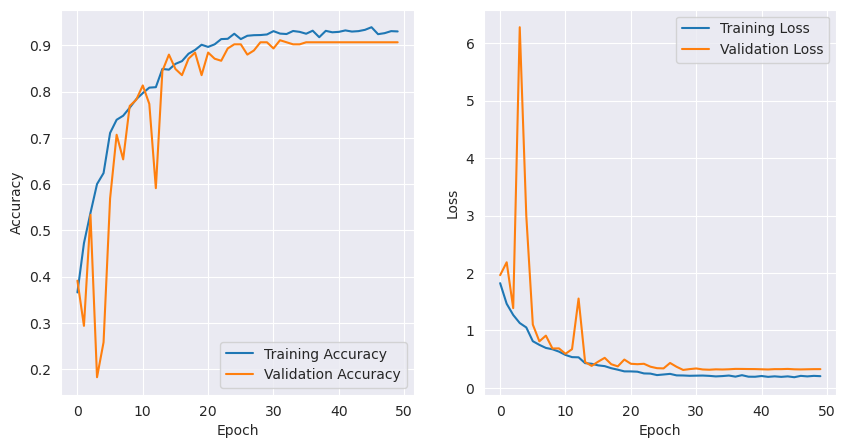

In [18]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

3/3 [==============================] - 35s 13s/step
There were 24 errors in 225 tests for an accuracy of  89.33


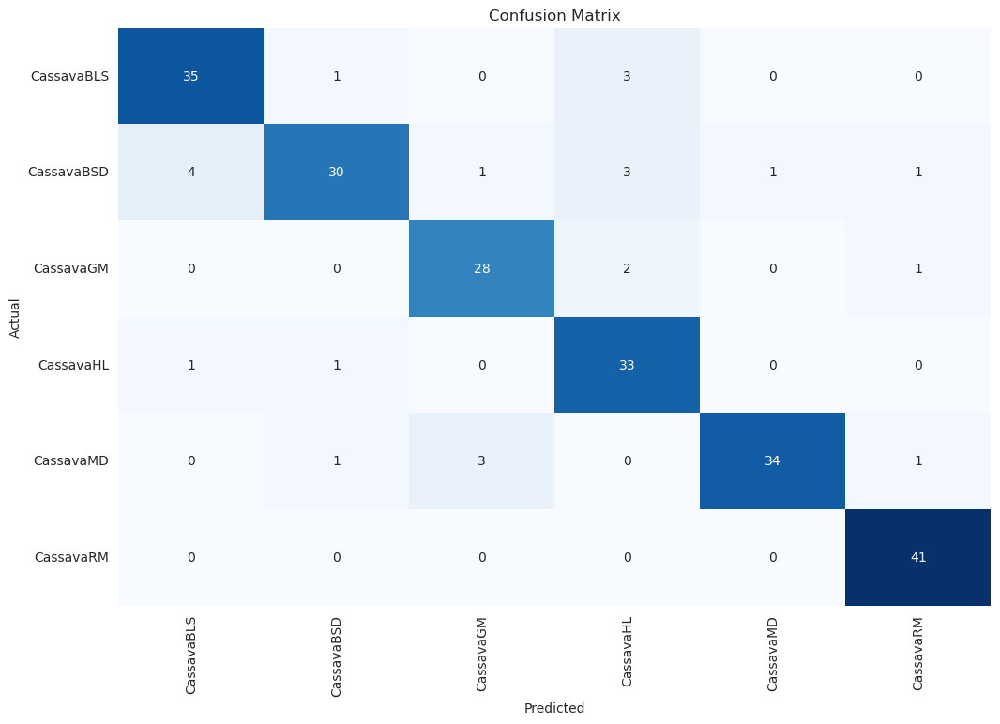

Classification Report:
----------------------
               precision    recall  f1-score   support

  CassavaBLS     0.8750    0.8974    0.8861        39
  CassavaBSD     0.9091    0.7500    0.8219        40
   CassavaGM     0.8750    0.9032    0.8889        31
   CassavaHL     0.8049    0.9429    0.8684        35
   CassavaMD     0.9714    0.8718    0.9189        39
   CassavaRM     0.9318    1.0000    0.9647        41

    accuracy                         0.8933       225
   macro avg     0.8945    0.8942    0.8915       225
weighted avg     0.8972    0.8933    0.8923       225



In [19]:
def prediction_evaluation(test_gen, test_steps):
    y_pred = []
    y_true = test_gen.labels
    classes = list(test_gen.class_indices.keys())
    class_count = len(classes)
    error_count = 0
    preds = model.predict(test_gen, verbose=1)
    tests = len(preds)

    for i, p in enumerate(preds):
        pred_index = np.argmax(p)
        true_index = test_gen.labels[i]  # labels are integer values
        if pred_index != true_index:  # a misclassification has occurred
            error_count += 1
        y_pred.append(pred_index)

    accuracy = (1 - error_count / tests) * 100
    print(f'There were {error_count} errors in {tests} tests for an accuracy of {accuracy:6.2f}')
    y_pred = np.array(y_pred)
    y_true = np.array(y_true)

    if class_count <= 30:
        confusion_mat = confusion_matrix(y_true, y_pred)
        # plot the confusion matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(confusion_mat, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(class_count) + .5, classes, rotation=90)
        plt.yticks(np.arange(class_count) + .5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()

    classification_rep = classification_report(y_true, y_pred, target_names=classes, digits=4)  # create classification report
    print("Classification Report:\n----------------------\n", classification_rep)
    return error_count, tests

errors, tests = prediction_evaluation(test_generator, test_steps)

In [20]:
score = model.evaluate(test_generator, verbose=1)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

3/3 [==============================] - 29s 10s/step - loss: 0.2794 - accuracy: 0.8933
Test loss: 0.27941983938217163 / Test accuracy: 0.8933333158493042


1/1 [==============================] - 0s 191ms/step


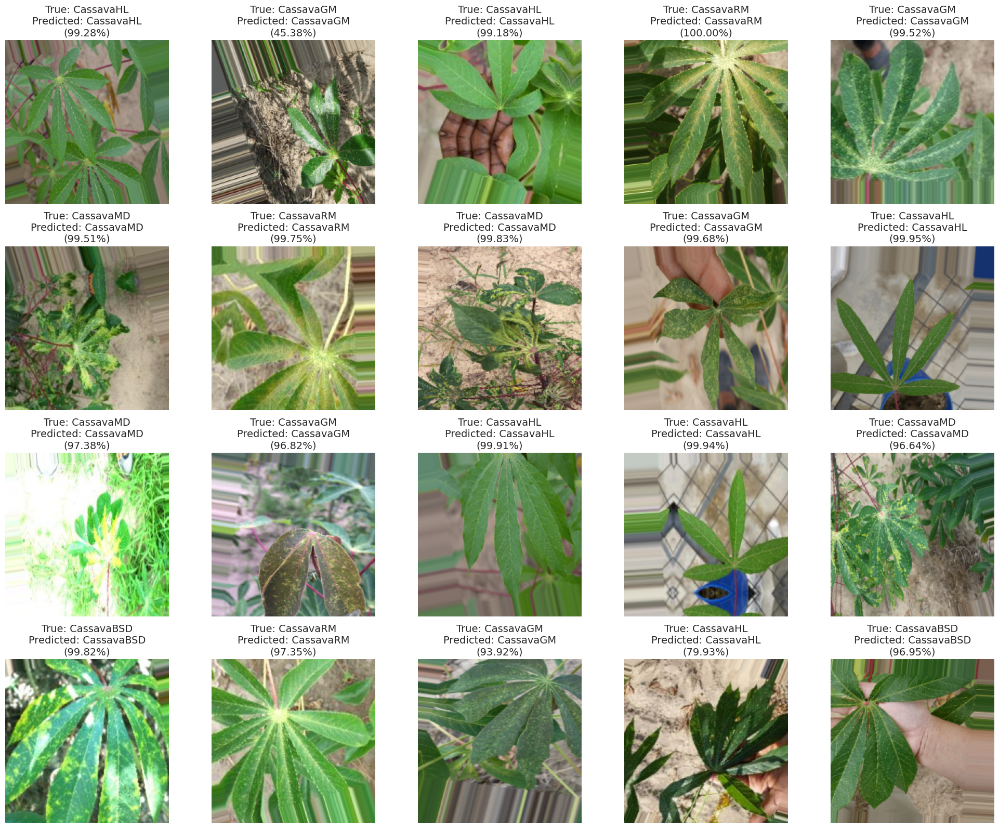

In [21]:
def show_sample_images(generator, model):
    class_dict = generator.class_indices
    classes = list(class_dict.keys())
    images, labels = next(generator)  # get a sample batch from the generator
    predictions = model.predict(images)
    predicted_labels = [classes[np.argmax(pred)] for pred in predictions]
    predicted_probs = np.max(predictions, axis=1)

    plt.figure(figsize=(20, 20))
    length = len(labels)
    if length < 25:  # show maximum of 25 images
        r = length
    else:
        r = 25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        true_label_index = np.argmax(labels[i])
        true_class_name = classes[true_label_index]
        predicted_class_name = predicted_labels[i]
        predicted_prob = predicted_probs[i]
        plt.title(f"True: {true_class_name}\nPredicted: {predicted_class_name}\n({predicted_prob:.2%})", fontsize=14)
        plt.axis('off')

    plt.tight_layout()  # adjust subplot layout
    plt.show()

# Example usage
show_sample_images(train_generator, model)

In [22]:
model.save('singkong-ntf3.h5')